# Исследование рынка Москвы в сфере заведений общественного питания

# Введение

**Название проекта:** "Исследование рынка Москвы в сфере заведений общественного питания".

**Описание проекта:** используя данные о заведениях общественного питания Москвы провести исследование этого рынка и подготовить презентацию с выводами и рекомендациями по выбору места для инвесторов фонда.

**Цель:** Найти интересные особенности, которые помогут определиться с типом и местоположением заведения.

**Задачи:**
1. Подготовить данные к анализу
2. Изучить и проанализировать данные
3. Составить картину московской кофейни
4. Выбрать основные выводы и подготовить презентацию для инвесторов

**Описание исходных данных:** набор данных moscow_places.csv содержит в себе информацию о заведениях общественного питания г. Москва: название, адрес, категорию, часы работы, рейтинг, цены и т.д. Источник данных - сервисы Яндекс Карты и Яндекс Бизнес от лета 2022 г.

# Загрузка данных

## Подключение библиотек

In [462]:
import pandas as pd
from plotly import graph_objects as go
import seaborn as sns
import matplotlib.pyplot as plt
import json
import folium
from folium import Map, Choropleth
from folium import Marker
from folium.plugins import MarkerCluster




## Загрузка данных

In [463]:
try:
    try:
        data = pd.read_csv(r"C:\Users\Gleb\Мой диск\ЯПрактикум\проект как рассказать историю с помощью данных\moscow_places.csv")
    except:
        data = pd.read_csv('/Users/glebderabin/Мой диск/ЯПрактикум/проект как рассказать историю с помощью данных/moscow_places.csv')
except:
    data = pd.read_csv('/datasets/moscow_places.csv')

display(data.info())
display(data.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


None

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


В наборе данных представлена информация о 8406 заведениях. Имеются пропуски, названия столбцов отфеорматированы правильно.
* name содержит в себе названия заведений и имеет соотв. тип
* category отражает категорию заведения и так же имеет тип object
* address содержит информацию об адресе заведения
* district содержит название административного округа, к которому относится заведение
* hours содержит информацию о времени работы в не очень удобном формате для анализа. В столбце есть пропуски
* lat и lng содержат информацию о высоте и долготе места. Тип верный
* rating содержит информацию о рейтинге заведения от 0 до 5, тип верный
* price содержит информацию о ценах в заведении: средние, выше среднего и т.д. Тип верный, есть пропуски
* avg_bill содержит информацию о средней стоимости заказа в виде диапазона. Тип верный, есть пропуски
* middle_avg_bill содержит информацию о значении средней стоимости заказа, формируется из предыдущего столбца. Тип верный, есть пропуски
* middle_coffee_cup содержит число с оценкой одной чашки капучино, формируется из столбца avg_bill, есть пропуски
* chain содержит число, выраженное 0 или 1, которое показывает, является ли заведение сетевым
* seats содержит кол-во посадочных мест. Есть пропуски, тип данных - число с плавающей запятой, так как имеются пропуски.


# Предобработка данных

In [464]:
# проверка количества дубликатов строк
print('Количество полных дубликатов строк в таблице: ', data.duplicated().sum())

Количество полных дубликатов строк в таблице:  0


Полных дубликатов строк в наборе данных не обнаружено.

На предыдущем этапе выяснено, что в полях hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats довольно много пропущенных значений. При их неверном заполнении можно внести недостоверные данные, которые повлияют на результаты исследования, поэтому заполнять пропуски не буду.

In [465]:
# Создание столбца street с названиями улиц из столбца с адресом
# разделяю строку по запятым и беру часть с обозначением улицы (1)
data['street'] = [x.split(',')[1] for x in data['address'].values]

# создание столбца is_24/7
data['is_24/7'] = data['hours'].str.contains('ежедневно, круглосуточно')

In [466]:
# привожу к нижнему регистру названия заведений
data['name'] = data['name'].str.lower()

# проверяю дубликаты по названию заведения и адресу
data['is_dublicated'] = data[['name', 'address']].duplicated()
print('Обнаружено дубликатов по названию и адресу:', data['is_dublicated'].sum())
data = data.query('is_dublicated == False')

# проверяю неявные дубликаты районов, категорий заведений и цен
print('Районы в датасете:', data['district'].unique())
print('')
print('Категории заведений в датасете:', data['category'].unique())
print('')
print('Категории цен в датасете:', data['price'].unique())



Обнаружено дубликатов по названию и адресу: 3
Районы в датасете: ['Северный административный округ'
 'Северо-Восточный административный округ'
 'Северо-Западный административный округ'
 'Западный административный округ' 'Центральный административный округ'
 'Восточный административный округ' 'Юго-Восточный административный округ'
 'Южный административный округ' 'Юго-Западный административный округ']

Категории заведений в датасете: ['кафе' 'ресторан' 'кофейня' 'пиццерия' 'бар,паб' 'быстрое питание'
 'булочная' 'столовая']

Категории цен в датасете: [nan 'выше среднего' 'средние' 'высокие' 'низкие']


In [467]:
# проверяю выбросы и аномалии числовые поля
data.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8403.000000,8403.000000,8403.000000,3149.000000,535.000000,8403.000000,4792.000000
mean,55.750096,37.608604,4.229894,958.053668,174.721495,0.381173,108.361436
std,0.069664,0.098583,0.470426,1009.732845,88.951103,0.485704,122.841130
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705018,37.538637,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753407,37.605260,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795028,37.664810,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


вызывает подозрение средний чек и кол-во мест. Построю для этих полей графики с усами

Text(0, 0.5, 'Средний чек, рубли')

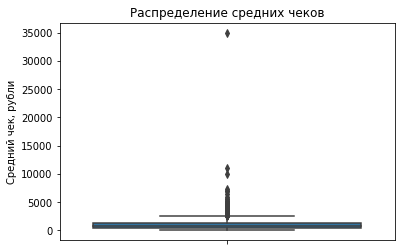

In [468]:
fig, ax = plt.subplots()
ax = sns.boxplot(data = data, y = 'middle_avg_bill')
ax.set_title('Распределение средних чеков')
ax.set_ylabel('Средний чек, рубли')

In [469]:
len(data.query('middle_avg_bill > 2500'))

104

Верхняя граница неаномальных значений расположена на уровне 2500 рублей. Заведений с ценником выше - 104, около 1% от общего кол-ва заведений.

Text(0, 0.5, 'Средний чек, рубли')

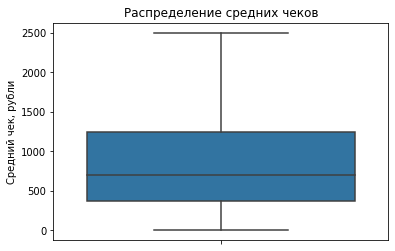

In [470]:
data = data.drop(data[data.middle_avg_bill > 2500].index)
fig, ax = plt.subplots()
ax = sns.boxplot(data = data, y = 'middle_avg_bill')
ax.set_title('Распределение средних чеков')
ax.set_ylabel('Средний чек, рубли')

Text(0, 0.5, 'кол-во мест')

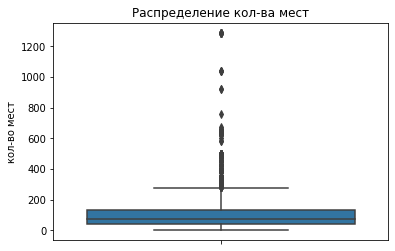

In [471]:
# то же самое для кол-ва мест

fig, ax = plt.subplots()
ax = sns.boxplot(data = data, y = 'seats')
ax.set_title('Распределение кол-ва мест')
ax.set_ylabel('кол-во мест')

In [472]:
len(data.query('seats > 300'))

249

Text(0, 0.5, 'кол-во мест')

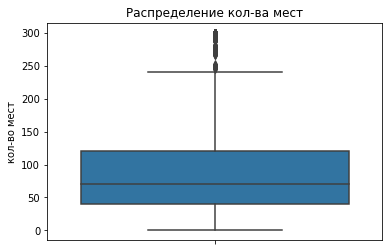

In [473]:
data = data.drop(data[data.seats > 300].index)
fig, ax = plt.subplots()
ax = sns.boxplot(data = data, y = 'seats')
ax.set_title('Распределение кол-ва мест')
ax.set_ylabel('кол-во мест')

Исходя из той же логики исключаю из анализа заведения с 300 местами и больше. Это около 100 заведений, незначительно количество

Выводы по предобработке данных: в наборе данных отсутствуют полные дубликаты, но присутствует много пропусков. Их невозможно заполнить достоверными данными, поэтому принято решение оставить пропуски, чтобы не искажать результаты исследования. Найдены и удалены три дубликата по сочетанию название заведения + полный адрес. Неявные дубликаты в категориальных полях не обнаружены. Отброшено незначительное количество заведений из-за аномалий в среднем чеке и кол-ве мест. Созданы столбцы street и is_24/7 для дальнейшей работы.

# Анализ данных

## Категории заведений

In [474]:
# изучаю, какие категории есть в наборе данных
print(data['category'].unique())

# считаю кол-во заведений по каждой категории
data_cat = data.groupby(by='category').agg({'name': 'count'}).sort_values(by='name', ascending=False)
display(data_cat)

# строю круговую диаграмму по кол-ву заведений для каждой категории
fig = go.Figure(data=[go.Pie(labels=data_cat.index.to_list(), values=data_cat['name'], title='Распределение заведений по категориям')])
fig.show()

['кафе' 'ресторан' 'кофейня' 'пиццерия' 'бар,паб' 'быстрое питание'
 'булочная' 'столовая']


,name
category,
кафе,2316
ресторан,1887
кофейня,1373
"бар,паб",717
пиццерия,612
быстрое питание,585
столовая,308
булочная,252


В данных представлена информация о заведениях категорий кафе, ресторан, кофейня, пиццерия, бар или паб, быстрое питание, булочная, столовая. Самая популярная категория - кафе, к ней относятся 2316 заведений. Самая редкая категория - булочная, всего 252 заведения. На интерактивной круговой диаграмме представлены доли категорий: категории кафе и рестораны каждая составляет около четверти от всех заведений. Кофейни - 17%, бары и пабы - 9%, пиццерии и предприятия быстрого питания - по 7%, столовые и булочные - по 3%.


## Кол-во мест по категориям

,seats
category,
ресторан,80.0
"бар,паб",78.0
столовая,72.0
кофейня,70.0
быстрое питание,60.0
кафе,55.0
пиццерия,50.0
булочная,48.5


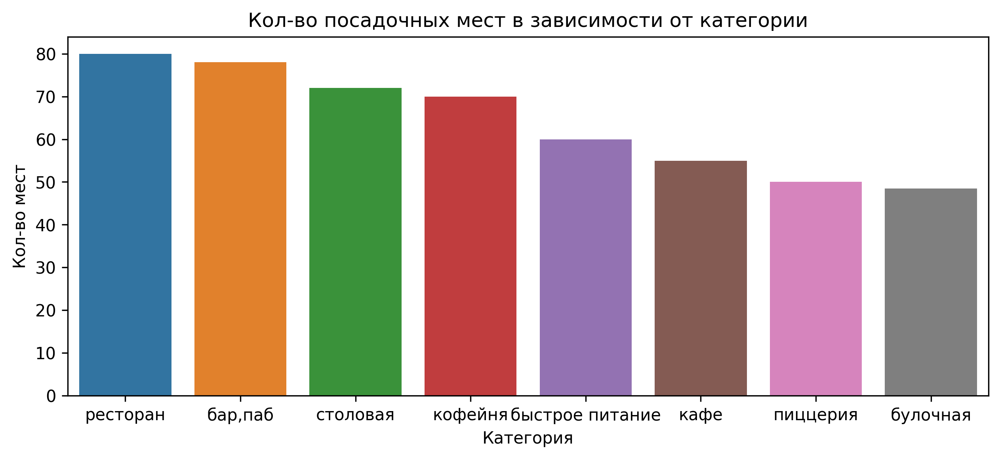

In [475]:
# вычисляю медианное кол-во мест в заведениях по категориям
data_seats = data.groupby('category').agg({'seats': 'median'}).sort_values(by='seats', ascending=False)
display(data_seats)

# визуализирую результаты для сравнения при помощи столбчатой диаграммы
fig, ax = plt.subplots(dpi=300)
ax = sns.barplot(data=data_seats, x=data_seats.index.to_list(), y='seats')
ax.set_title('Кол-во посадочных мест в зависимости от категории')
ax.set_xlabel('Категория')
ax.set_ylabel('Кол-во мест')
fig.set_figwidth(10)



В заведениях категории ресторан медианное кол-во посадочных мест больше, чем в других - 80. Далее по убыванию расположены бары, кафейни, столовые, предприятия быстрого питания, кафе, пиццерии и булочные.

## Соотношение сетевых и несетевых заведений

,name
chain,
0,4966
1,3084


Text(0.5, 1.0, 'Соотношение сетевых и несетевых заведений')

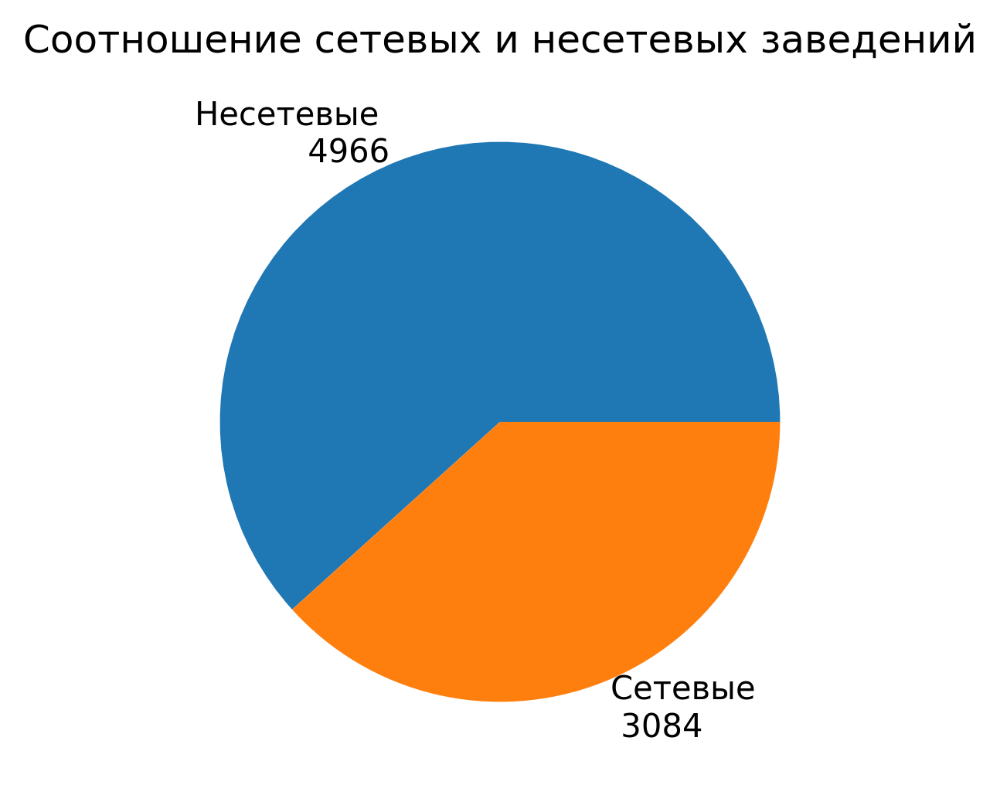

In [476]:
# считаю кол-во заведений по каждой категории
data_chain = data.groupby(by='chain').agg({'name': 'count'}).sort_values(by='name', ascending=False)
display(data_chain)

# строю круговую диаграмму по кол-ву заведений для каждой категории
fig, ax = plt.subplots(dpi=300)
ax.pie(x=data_chain['name'], labels=[f'Несетевые \n {data_chain["name"][0]}', f'Сетевые \n {data_chain["name"][1]}'])
ax.set_title('Соотношение сетевых и несетевых заведений')


В наборе данных больше несетевых заведений (4966), чем сетевых (3084)

## Соотношение категорий по сетевым/несетевым

,chain
category,
булочная,0.611111
пиццерия,0.522876
кофейня,0.505462
быстрое питание,0.382906
ресторан,0.363540
кафе,0.326425
столовая,0.279221
"бар,паб",0.228731


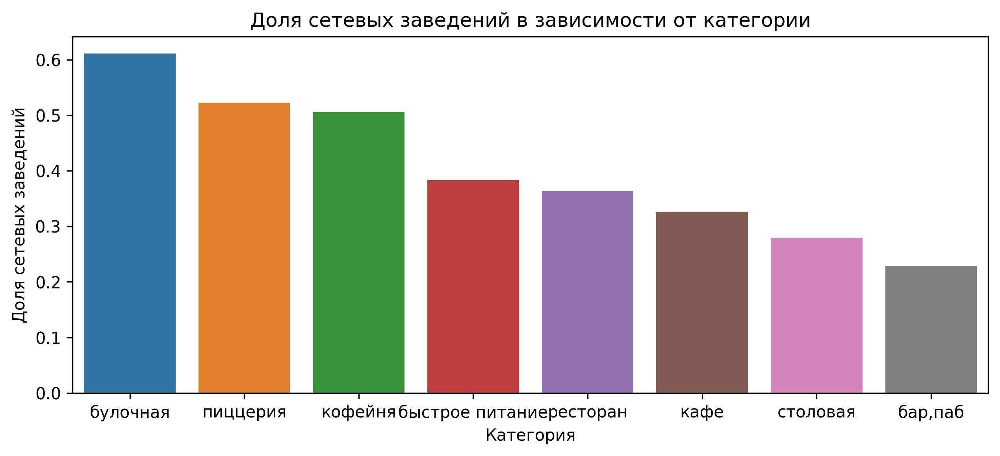

In [477]:
# вычисляю долю сетевых заведений по категориям
data_chain_cat = data.groupby('category').agg({'chain': 'mean'}).sort_values(by='chain', ascending=False)
display(data_chain_cat)

# визуализирую результаты для сравнения при помощи столбчатой диаграммы
fig, ax = plt.subplots(dpi=300)
ax = sns.barplot(data=data_chain_cat, x=data_chain_cat.index.to_list(), y='chain')
ax.set_title('Доля сетевых заведений в зависимости от категории')
ax.set_xlabel('Категория')
ax.set_ylabel('Доля сетевых заведений')
fig.set_figwidth(10)

Чаще всего сетевыми заведениями являются булочные и пицерии (более половины всех заведений), кофейни. Реже всего - бары и пабы (около 0,2 от всех заведений).

## Топ-15 популярных сетей

,chain,category,avg_bill
name,,,
шоколадница,115,кофейня,Цена чашки капучино:239–274 ₽
домино'с пицца,76,пиццерия,Средний счёт:от 500 ₽
додо пицца,72,пиццерия,Средний счёт:328 ₽
one price coffee,68,кофейня,Цена чашки капучино:60–100 ₽
яндекс лавка,67,ресторан,None
cofix,63,кофейня,Цена чашки капучино:от 60 ₽
prime,47,ресторан,Средний счёт:400–600 ₽
хинкальная,44,быстрое питание,Средний счёт:300–500 ₽
кофепорт,40,кофейня,Цена чашки капучино:90–100 ₽


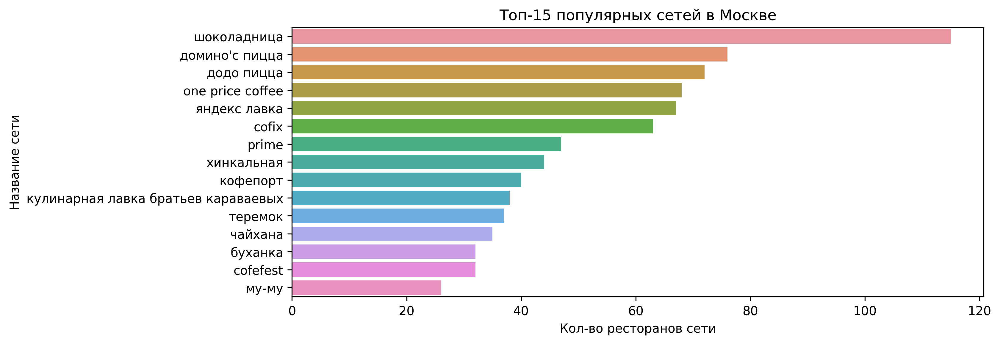

In [478]:
# определяю топ сетей
data_top_chain = data.groupby(by='name').agg({'chain': 'sum', 'category': 'first', 'avg_bill': 'first'}).sort_values(by='chain', ascending=False)[:15]
display(data_top_chain)

# визуализирую
fig, ax = plt.subplots(dpi=300)
ax = sns.barplot(data=data_top_chain, x='chain', y=data_top_chain.index.to_list())
ax.set_title('Топ-15 популярных сетей в Москве')
ax.set_xlabel('Кол-во ресторанов сети')
ax.set_ylabel('Название сети')
fig.set_figwidth(10)

ТОП-15 сетей москвы по кол-ву заведений представлены в таблице и на диаграмме. Самая популярная сеть - шоколадница. Мне знакомы сети Шоколадница, Додо Пицца, Cofix, Теремок, Му-Му. У между сетями не так много общего, кроме их массовости. В основном это довольно бюджетные заведения, ориентированы на самую широкую аудиторию с довольно традиционной кухней. Места, ориентированные на любой случай жизни: от будничнего обеда до встречи со старыми друзьями. Категории разнообразные: кофейни, пиццерии, рестораны и даже булочные. Нет баров и столовых.

## Заведения по администртивным округам

['Северный административный округ'
 'Северо-Восточный административный округ'
 'Северо-Западный административный округ'
 'Западный административный округ' 'Центральный административный округ'
 'Восточный административный округ' 'Юго-Восточный административный округ'
 'Южный административный округ' 'Юго-Западный административный округ']


,name
district,
Центральный административный округ,2090
Северо-Восточный административный округ,868
Северный административный округ,846
Южный административный округ,841
Западный административный округ,811
Восточный административный округ,782
Юго-Восточный административный округ,706
Юго-Западный административный округ,702
Северо-Западный административный округ,404


,district,name,category
46,Центральный административный округ,587,ресторан
43,Центральный административный округ,444,кафе
44,Центральный административный округ,414,кофейня
40,Центральный административный округ,340,"бар,паб"
51,Юго-Восточный административный округ,280,кафе
...,...,...,...
32,Северо-Западный административный округ,22,"бар,паб"
63,Юго-Западный административный округ,17,столовая
39,Северо-Западный административный округ,17,столовая
49,Юго-Восточный административный округ,13,булочная


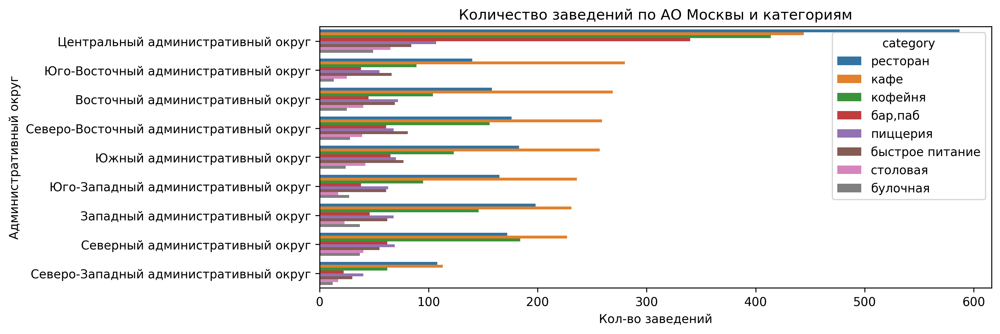

In [479]:
# какие АО есть в датасете
print(data['district'].unique())

# общее кол-во заведений по округам
# делаю сводную таблицу
data_district = data.groupby(by='district').agg({'name': 'count'}).sort_values(by='name', ascending=False)
display(data_district)

# Кол-во заведений по округам и категориям
# делаю сводную таблицу и строю столбчатый график
data_district_and_category = data.groupby(by=['district', 'category'], as_index=False).agg({'name': 'count', 'category': 'first'}).sort_values(by='name', ascending=False)
display(data_district_and_category)

fig, ax = plt.subplots(dpi = 300)
ax = sns.barplot(data=data_district_and_category, x='name', y='district', hue='category')
ax.set_title('Количество заведений по АО Москвы и категориям')
ax.set_xlabel('Кол-во заведений')
ax.set_ylabel('Административный округ')
fig.set_figwidth(10)


В датасете представлена информация по 9 АО Москвы:
* Северный административный округ
* Северо-Восточный административный округ
* Северо-Западный административный округ
* Западный административный округ
* Центральный административный округ
* Восточный административный округ
* Юго-Восточный административный округ
* Южный административный округ
* Юго-Западный административный округ

В ЦАО больше всего заведений общественного питания: 2090. В СЗАО меньше всего заведений - всего 404. Распределение кол-ва заведений по категориям и районам показано на графике. Можно отметить, что во всех районах кроме ЦАО кафе идут на первом месте по кол-ву заведений. Меняются между собой соотношения между числом заведений разной категории в разных районах. 

## Средний рейтинг заведений по категориям

,category,rating
0,"бар,паб",4.386890
5,пиццерия,4.301307
6,ресторан,4.281664
4,кофейня,4.278733
1,булочная,4.265079
7,столовая,4.212662
3,кафе,4.124352
2,быстрое питание,4.044957


,category,rating
0,"бар,паб",4.4
1,булочная,4.3
4,кофейня,4.3
5,пиццерия,4.3
6,ресторан,4.3
7,столовая,4.3
2,быстрое питание,4.2
3,кафе,4.2


(4.0, 4.5)

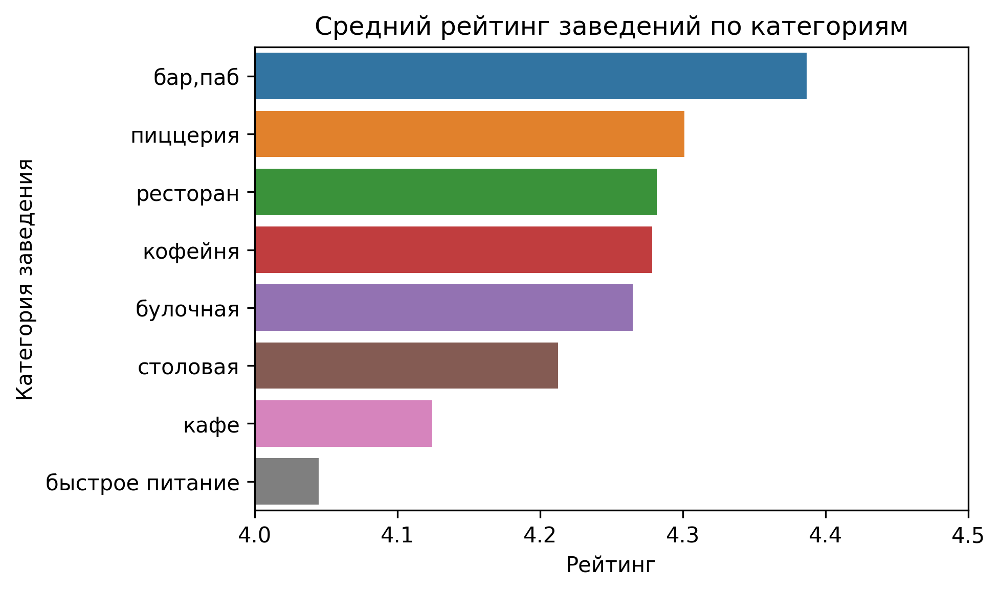

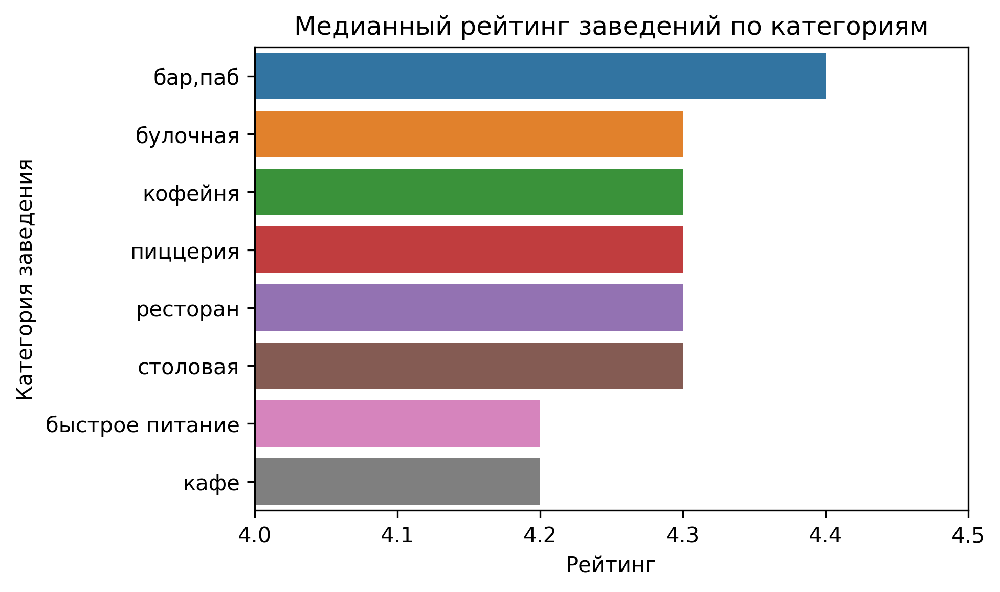

In [480]:
# в зависимости от того, что брать за среднее (арифм. или медианный рейтинг), места в нем различаются. Изучим оба

data_category_rating_mean = data.groupby('category', as_index=False).agg({'rating': 'mean'}).sort_values('rating', ascending=False)
display(data_category_rating_mean)

fig, ax = plt.subplots(dpi = 300)
ax = sns.barplot(data=data_category_rating_mean, x='rating', y='category')
ax.set_title('Средний рейтинг заведений по категориям')
ax.set_xlabel('Рейтинг')
ax.set_ylabel('Категория заведения')
ax.set_xlim(4, 4.5)

data_category_rating_median = data.groupby('category', as_index=False).agg({'rating': 'median'}).sort_values('rating', ascending=False)
display(data_category_rating_median)

fig, ax = plt.subplots(dpi = 300)
ax = sns.barplot(data=data_category_rating_median, x='rating', y='category')
ax.set_title('Медианный рейтинг заведений по категориям')
ax.set_xlabel('Рейтинг')
ax.set_ylabel('Категория заведения')
ax.set_xlim(4, 4.5)



В обоих постановках рейтинг заведений по категориям различается не так уж и сильно: от 4.04 до 4.4. Лучшей категорией в обеих постановках становится категория баров и пабов с рейтингом 4.4. Худшая категория по медиане - кафе (4.2), по среднему - быстрое питание (4.04). Можно сделать предположение, что в категории быстрое питание и кафе много заведений с очень низким рейтингом (1, 2). Они не влияют на медиану, но сильно утягивают среднее.

## Хороплет со средним рейтингом заведений по районам


In [481]:

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# готовлю данные для отображения

data_geo_rating = data.groupby(by='district', as_index=False).agg({'rating': 'median'}).sort_values('rating', ascending=False)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
try:
    Choropleth(
        geo_data='/datasets/admin_level_geomap.geojson',
        data=data_geo_rating,
        columns=['district', 'rating'],
        key_on='feature.name',
        fill_color='YlGn',
        fill_opacity=0.8,
        legend_name='Медианный рейтинг заведений по районам',
    ).add_to(m)
except:
    Choropleth(
        geo_data='/Users/glebderabin/Мой диск/ЯПрактикум/проект как рассказать историю с помощью данных/admin_level_geomap.geojson',
        data=data_geo_rating,
        columns=['district', 'rating'],
        key_on='feature.name',
        fill_color='YlGn',
        fill_opacity=0.8,
        legend_name='Медианный рейтинг заведений по районам',
    ).add_to(m)

# выводим карту
m

Для построения хороплета использовался медианный рейтинг по районам. Самые лучшие заведения с самыми лучшими оценками - конечно же в ЦАО. Самый низкий рейтинг - в ЮВАО и СВАО. Возможно, это связано с тем, что районы менее престижные и благополучные в целом по уровню жизни.

## Все заведения на карте Москвы

In [482]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

На карте представлены все заведения, представленные в наборе данных.

## Топ-15 улиц по кол-ву заведений

Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.

Text(0, 0.5, 'Улица')

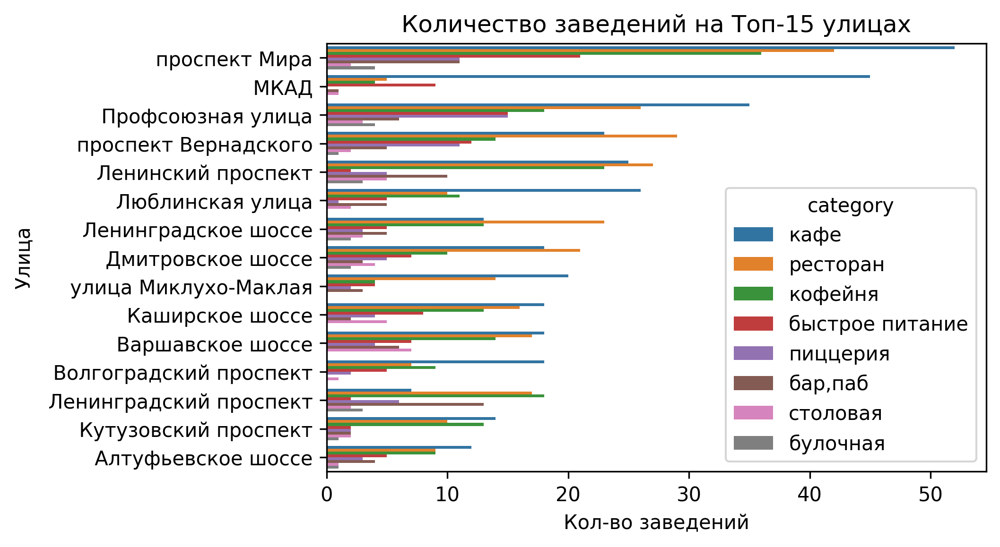

In [483]:
# получаю список топ-15 улиц
data_top_streets = data.groupby('street').agg({'name': 'count'}).sort_values('name', ascending=False)[:15]
top_streets_list = data_top_streets.index.to_list()

# делаю срез по этим улицам и группирую по улицам и категориям для построения графика
data_top_streets_category = data.query('street in @top_streets_list')
data_top_streets_category = data_top_streets_category.groupby(by=['street', 'category'], as_index=False).agg({'name': 'count'}).sort_values('name', ascending=False)

# делаю барчарт по улицам и категориям

fig, ax = plt.subplots(dpi = 300)
ax = sns.barplot(data=data_top_streets_category, x='name', y='street', hue='category')
ax.set_title('Количество заведений на Топ-15 улицах')
ax.set_xlabel('Кол-во заведений')
ax.set_ylabel('Улица')

На столбчатой диаграмме представлено распределение кол-ва заведений по Топ-15 улицам Москвы и категориям. В числе лидеров - пр. Мира, МКАД, Профсоюзная ул., Вернадского пр. Распределение заведений на лучших улицах в целом сохраняется, кроме нескольких исключений: на МКАДе расположены в основном кафе и заведения быстрого питания, ресторанов значительно меньше, чем на других. Это связано с отдаленностью улицы от центра.

## Единственные заведения на улице

In [484]:
# группирую по улицам, считаю заведения, делаю срез и получаю список улиц с одним заведением
one_cafe_streets_list = (data.groupby('street', as_index=False)
                                .agg({'name': 'count'})
                                .sort_values('name')
                                .query('name == 1')['street'].to_list())

# делаю срез по отобранным улицам
data_one_street = data.query('street in @one_cafe_streets_list')
data_one_street = data_one_street.groupby(by='category', as_index=False).agg({'name': 'count'}).sort_values('name', ascending=False)

# строю круговую диаграмму по кол-ву заведений для каждой категории
fig = go.Figure(data=[go.Pie(labels=data_one_street['category'], values=data_one_street['name'])])
fig.show()

В отличие от данных по всем улицам, единственные заведения на улице чаще являются кафе. 

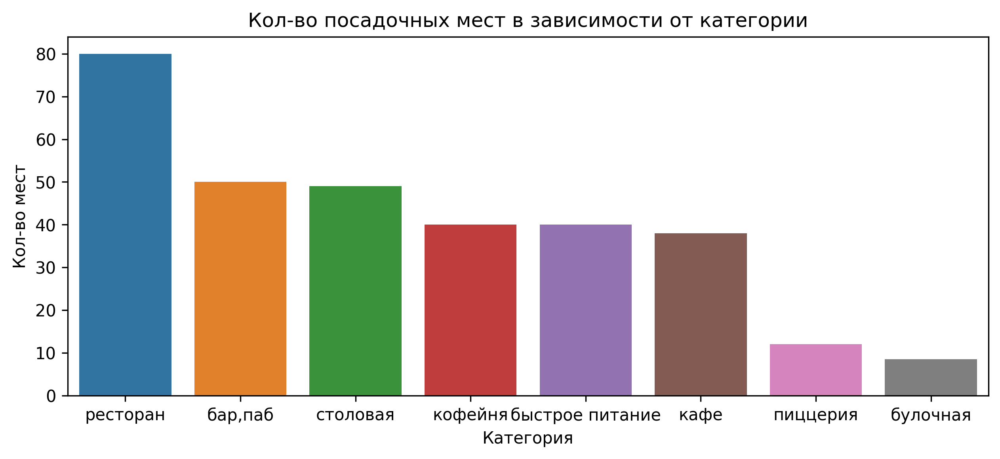

In [485]:
# сравним по кол-ву мест и категориям 
data_one_street = data.query('street in @one_cafe_streets_list')
# вычисляю медианное кол-во мест в заведениях по категориям
data_one_street = data_one_street.groupby('category').agg({'seats': 'median'}).sort_values(by='seats', ascending=False)

# визуализирую результаты для сравнения при помощи столбчатой диаграммы
fig, ax = plt.subplots(dpi=300)
ax = sns.barplot(data=data_one_street, x=data_seats.index.to_list(), y='seats')
ax.set_title('Кол-во посадочных мест в зависимости от категории')
ax.set_xlabel('Категория')
ax.set_ylabel('Кол-во мест')
fig.set_figwidth(10)

По сравнению с заведениями на всех улицах, в ресторанах осталось примерно то же кол-во мест, а во всех остальных категориях снизилось на 20-30 мест.

Можно предположить, что заведения, являющиеся единственными на целой улице чаще относятся к кафе с прицелом на широкую аудиторию района/улицы. Все эти заведения значительно меньше чем в общем случае.

## Хороплет по среднему чеку

Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

In [486]:
data_geo_price = data.groupby(by='district', as_index=False).agg({'middle_avg_bill': 'median'})
data_geo_price

,district,middle_avg_bill
0,Восточный административный округ,525.0
1,Западный административный округ,850.0
2,Северный административный округ,625.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,675.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,426.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [487]:
# считаю медиану столбца middle_avg_bill по районам
data_geo_price = data.groupby(by='district', as_index=False).agg({'middle_avg_bill': 'median'})

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
try:
    Choropleth(
        geo_data='/datasets/admin_level_geomap.geojson',
        data=data_geo_price,
        columns=['district', 'middle_avg_bill'],
        key_on='feature.name',
        fill_color='YlGn',
        fill_opacity=0.8,
        legend_name='Медианный средний чек по районам',
    ).add_to(m)
except:
    Choropleth(
        geo_data='/Users/glebderabin/Мой диск/ЯПрактикум/проект как рассказать историю с помощью данных/admin_level_geomap.geojson',
        data=data_geo_price,
        columns=['district', 'middle_avg_bill'],
        key_on='feature.name',
        fill_color='YlGn',
        fill_opacity=0.8,
        legend_name='Медианный средний чек по районам',
    ).add_to(m)

# выводим карту
m

Самый высокий медианный средний чек в ЦАО и ЗАО - 1000 рублей. С удалением от центра чек снижается до 600-700 рублей ЮЗАО, СЗАО, САО. В оставшихся округах снижается до 450 рублей. Рассматривается административное устройство Москвы по АО, а не удаленности от центра. Распределение чека соответсвует ожиданиям от заведний в центральных и престижных районах.

In [488]:
data_geo_price

,district,middle_avg_bill
0,Восточный административный округ,525.0
1,Западный административный округ,850.0
2,Северный административный округ,625.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,675.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,426.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


## Выводы по анализу данных

**Категории**

Самая популярная категория - кафе, к ней относятся 2316 заведений. Самая редкая категория - булочная, всего 252 заведения. Категории кафе и рестораны каждая составляет около четверти от всех заведений. Кофейни - 17%, бары и пабы - 9%, пиццерии и предприятия быстрого питания - по 7%, столовые и булочные - по 3%. Бары и пабы имеют в среднем самый высокий рейтинг около 4.4. Худший рейтинг у заведений быстрого питания и кафе, от 4.04.

**Кол-во мест**

Медианное кол-во посадочных мест варьируется в пределах 50-80. В ресторанах самое большое кол-во посадочных мест - 80. Далее по убыванию расположены бары, столовые, кофейни, предприятия быстрого питания, кафе, пиццерии и булочные.

**Сетевые заведения**

В рассматриваемом наборе данных несетевые заведения превышают сетевые и соотносятся в количестве 4966 к 3084. Наиболее высокая доля сетевых заведений - 0.6 в категории булочных. Далее идут пиццерии и кофейни - доля сетевых заведений в этих категориях около 0.5. Самые популярные сети: Шоколадница, Домино'с Пицца, Додо Пицца и кофейни.

**География**

Больше всего заведений расположено в ЦАО. Меньше всего - в СЗАО. Во всех районах кроме ЦАО кафе являются самыми распространенными заведениями. Самый высокий рейтинг и средний чек - также в заведениях ЦАО. Улицы, на которых работают больше всего заведений: пр. Мира, МКАД, Профсоюзная ул., Вернадского пр. Если говорить о единственных заведениях на улице, то чаще, чем в общем, это будут кафе с значительно меньшим кол-вом посадочных мест.




# Детализируем открытие кофейни

Заказчики исследования выразили желание открыть кофейню и просят оценить своих будущих конкурентов и эту возможность. Дать рекоммендацию по открытию кофейни.


## Расположение кофеен

Кол-во кофеен в датасете: 1373


,district,name
5,Центральный административный округ,414
2,Северный административный округ,184
3,Северо-Восточный административный округ,156
1,Западный административный округ,146
8,Южный административный округ,123
0,Восточный административный округ,104
7,Юго-Западный административный округ,95
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


Text(0, 0.5, 'Название АО')

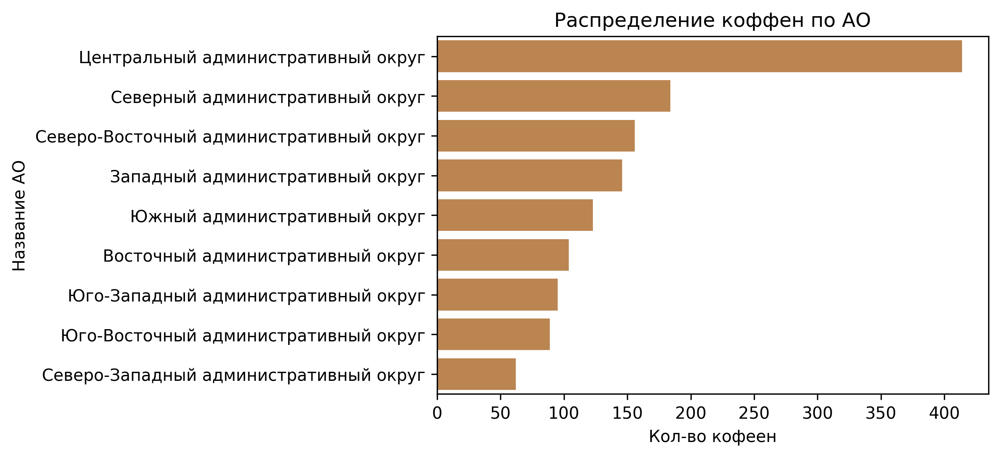

In [489]:
# оставляю в датасете только кофейни

data_coffee = data.query('category == "кофейня"')

# узнаю кол-во кофеен
print('Кол-во кофеен в датасете:', len(data_coffee))

# изучаю разбивку по районам
data_coffee_distr = data_coffee.groupby(by='district', as_index=False).agg({'name': 'count'}).sort_values('name', ascending=False)
display(data_coffee_distr)
fig, ax = plt.subplots(dpi=300)
ax = sns.barplot(data=data_coffee_distr, x='name', y='district', color='peru')
ax.set_title('Распределение коффен по АО')
ax.set_xlabel('Кол-во кофеен')
ax.set_ylabel('Название АО')

In [490]:
# наношу кофейни на карту, чтобы изучать тренды в расположении

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаю функцию для создания маркеров
def create_marker(row):
    folium.Marker([row['lat'], row['lng']], popup=row['name']).add_to(m)

# применяю функцию к строкам 
data_coffee.apply(create_marker, axis=1)

# вывожу карту на экран
m

Всего в наборе данных 1373 коффен. Больше всего кофеен в ЦАО, с двухкратным отрывом от САО. Из расположения кофеен на карте следует, что в основном они располагаются на основных улицах и проспектах, их пересечениях. Предположительно, скопления кофеен расположены рядом со станциями метро и офисными центрами, университетами. Эта гипотеза требует подтверждения с привлечением JSON файлов с координатами станций метро и указанных заведений. (Где их брать? Быстрым поиском по интернету не нашел). Для выбора оптимального местоположения следует проверить эти гипотезы, а также выделить список крупных улиц Москвы и сравнить их между собой с учетом конкуренции. Сейчас на карте можно обозначить зоны с высокой конкуренцией.

## Время работы

In [491]:
# Изучаю долю круглосуточных кофеен
print('Доля круглосуточных кофеен:', data_coffee['is_24/7'].mean())

data_coffee['hours'].unique()

Доля круглосуточных кофеен: 0.042709867452135494


array(['ежедневно, 09:00–22:00', 'ежедневно, 10:00–21:00',
       'пн-пт 08:00–18:00', 'пн-пт 09:00–19:00', 'ежедневно, 08:00–22:00',
       'ежедневно, 10:00–22:00', 'ежедневно, 09:00–21:00',
       'пн-пт 08:00–19:00', 'ежедневно, 08:00–21:00',
       'пн-пт 09:00–22:00; сб 10:00–22:00; вс 10:00–21:00',
       'пн-пт 08:30–18:30', 'пн-пт 07:30–18:30', 'пн-пт 09:00–18:00',
       'ежедневно, 10:00–22:00, перерыв 16:00–16:20',
       'ежедневно, круглосуточно', 'пн-сб 09:00–20:00; вс 09:00–18:00',
       'пн-пт 08:00–21:00; сб,вс 09:00–21:00',
       'пн-чт 08:00–22:00; пт 08:00–23:00; сб,вс 09:00–23:00',
       'ежедневно, 08:00–20:00', 'ежедневно, 08:00–23:00',
       'пн-пт 08:00–21:00; сб,вс 10:00–21:00',
       'пн-пт 11:00–22:00; сб,вс 10:00–22:00',
       'пн-пт 08:00–22:00; сб,вс 09:00–22:00',
       'пн-чт 08:30–21:30; пт 08:30–22:00; сб,вс 09:30–22:00',
       'пн-сб 07:00–21:00; вс 08:00–20:00',
       'пн-пт 08:00–20:00; сб,вс 09:00–20:00', 'пн-сб 10:00–20:00',
       'ежед

Круглосуточных коффен практически нет - всего 4% от общего числа. Другие режимы работы крайне разнообразны, но в целом можно описать как работу в будни с 7:00 до 22:00 и в выходные с 9:00 до 22:00. 

## Рейтинги

Какие у кофеен рейтинги? Как они распределяются по районам?


Средний рейтинг кофеен: 4.278732702112163
Медианный рейтинг кофеен: 4.3


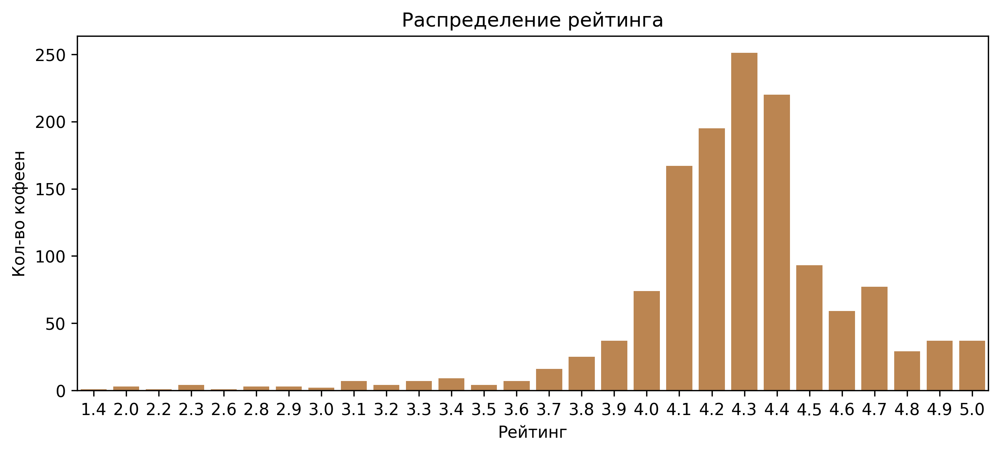

In [492]:
# средний рейтинг
print('Средний рейтинг кофеен:', data_coffee['rating'].mean())
print('Медианный рейтинг кофеен:', data_coffee['rating'].median())

# распределение рейтингов 
coffee_ratings = data_coffee.groupby('rating', as_index=False).agg({'name': 'count'}).sort_values('name', ascending=False)
# display(coffee_ratings)
fig, ax = plt.subplots(dpi=300)
ax = sns.barplot(data=coffee_ratings, x='rating', y='name', color='peru')
ax.set_title('Распределение рейтинга')
ax.set_xlabel('Рейтинг')
ax.set_ylabel('Кол-во кофеен')
fig.set_figwidth(10)

In [493]:
# хороплет с распределением рейтинга по районам

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# готовлю данные для отображения

data_coffee_geo_rating = data_coffee.groupby(by='district', as_index=False).agg({'rating': 'median'}).sort_values('rating', ascending=False)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
try:
    Choropleth(
        geo_data='/datasets/admin_level_geomap.geojson',
        data=data_coffee_geo_rating,
        columns=['district', 'rating'],
        key_on='feature.name',
        fill_color='YlGn',
        fill_opacity=0.8,
        legend_name='Медианный рейтинг кофеен по районам',
    ).add_to(m)
except:
    Choropleth(
        geo_data='/Users/glebderabin/Мой диск/ЯПрактикум/проект как рассказать историю с помощью данных/admin_level_geomap.geojson',
        data=data_coffee_geo_rating,
        columns=['district', 'rating'],
        key_on='feature.name',
        fill_color='YlGn',
        fill_opacity=0.8,
        legend_name='Медианный рейтинг кофеен по районам',
    ).add_to(m)

# выводим карту
m

Медианный и средний рейтинг очень близки друг к другу и в среднем равны 4.3. В основной массе кофейни имеют рейтинг от 4.1 до 4.4. Распределение рейтинга между кофейнями напоминает нормальное. По АО Москвы рейтинг распределен равномерно и составляет те же 4.3. Лишь в ЗАО в среднем у кофеен более низкий рейтинг: 4.2.

## Стоимость чашки

Средняя стоимость чашки капучино: 175 рублей


,middle_coffee_cup
district,
Западный административный округ,188.562500
Центральный административный округ,187.622642
Юго-Западный административный округ,184.176471
Восточный административный округ,174.023810
Северный административный округ,168.101449
Северо-Восточный административный округ,167.758621
Северо-Западный административный округ,165.523810
Южный административный округ,157.150000
Юго-Восточный административный округ,151.088235


Text(0.5, 0.98, 'Совместное распределение рейтинга и цены чашки')

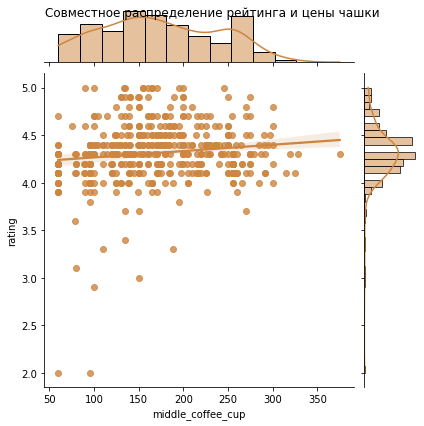

In [494]:
# средняя стоимость чашки капучино
print('Средняя стоимость чашки капучино:', int(data_coffee['middle_coffee_cup'].mean()), 'рублей')

# средняя стоимость чашки капучино по районам
display(data_coffee.groupby('district').agg({'middle_coffee_cup': 'mean'}).sort_values('middle_coffee_cup', ascending=False))

# средняя стоимость чашки и рейтинг
# отброшу аномалии
data_coffee_clean = data_coffee.query('middle_coffee_cup < 500')

p=sns.jointplot(data=data_coffee_clean, x='middle_coffee_cup', y='rating', kind='reg', color='peru')
p.fig.suptitle("Совместное распределение рейтинга и цены чашки")

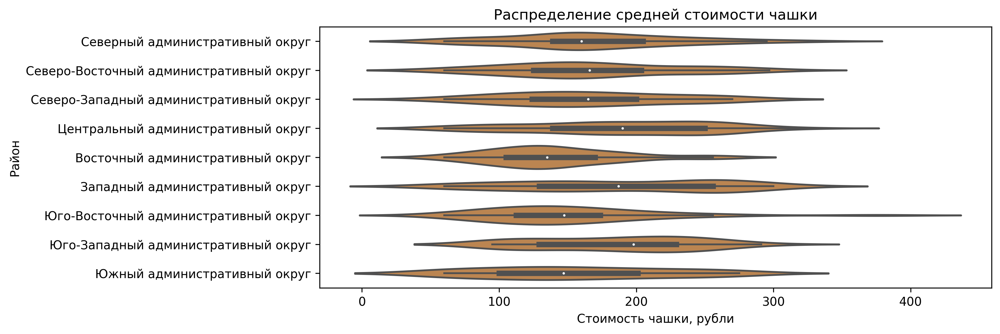

In [495]:

fig, ax = plt.subplots(dpi=300)
ax = sns.violinplot(data=data_coffee_clean, x='middle_coffee_cup', y='district', color='peru')
ax.set_title('Распределение средней стоимости чашки')
ax.set_xlabel('Стоимость чашки, рубли')
ax.set_ylabel('Район')
fig.set_figwidth(10)

Средняя стоимость чашки капучино в Москве: 175 рублей. В ЗАО самый дорогой кофе: средняя стоимость чашки достигает 188 рублей. Самая низкая цена в ЮВАО около 150 рублей. Стоимость чашки мало зависит от рейтинга кофейни. Рейтинг распределяется нормально, а цены - нет. Рекоммендация по цене за чашку: от 120 до 250 рублей в ЦАО, ЗАО и ЮЗАО, от 100 до 200 в остальных АО. Можно опираться на средние цены по району.

## Кол-во мест

Среднее кол-во мест в кофейнях:  89.65822784810126
Медианное кол-во мест в кофейнях:  70.0


,seats
district,
Западный административный округ,96.0
Северо-Западный административный округ,87.5
Центральный административный округ,80.0
Северо-Восточный административный округ,75.0
Юго-Западный административный округ,64.0
Северный административный округ,58.0
Южный административный округ,56.0
Восточный административный округ,53.5
Юго-Восточный административный округ,50.0


Text(0.5, 0.98, 'Совместное распределение цены чашки и кол-ва мест')

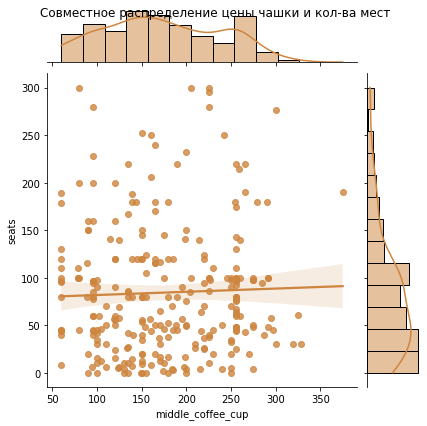

In [496]:
# среднее кол-во мест
print('Среднее кол-во мест в кофейнях: ', data_coffee['seats'].mean())
print('Медианное кол-во мест в кофейнях: ', data_coffee['seats'].median())

# Кол-во мест по районам
display(data_coffee.groupby('district').agg({'seats': 'median'}).sort_values('seats', ascending=False))

# Цена и кол-во мест
p=sns.jointplot(data=data_coffee_clean, x='middle_coffee_cup', y='seats', kind='reg', color='peru')
p.fig.suptitle("Совместное распределение цены чашки и кол-ва мест")

Text(0.5, 0.98, 'Совместное распределение рейтинга и кол-ва мест')

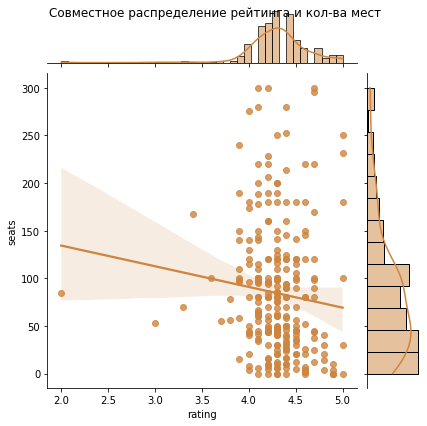

In [497]:
# Рейтинг и кол-во мест
p=sns.jointplot(data=data_coffee_clean, x='rating', y='seats', kind='reg', color='peru')
p.fig.suptitle("Совместное распределение рейтинга и кол-ва мест")

Оказывается, кофейни в Москве - это в основном большие заведения. Медианное кол-во мест в заведении - 70. От района кол-во мест зависит не так сильно, но стоит учесть, что при открытии кофейни в ЮВАО и ВАО чаще встречаются более маленькие кофейни (50-55 мест), а в ЗАО - более большие (96 мест). Цена чашки не зависит от количества мест в кофейне. Рейтинг слабо зависит от количества мест, но есть признаки того, что чем меньше и камернее заведение, тем выше у него рейтинг.


## Cети и индивидуалы

Доля сетевых кофеен: 0.5054624908958485


Text(0, 0.5, 'Район')

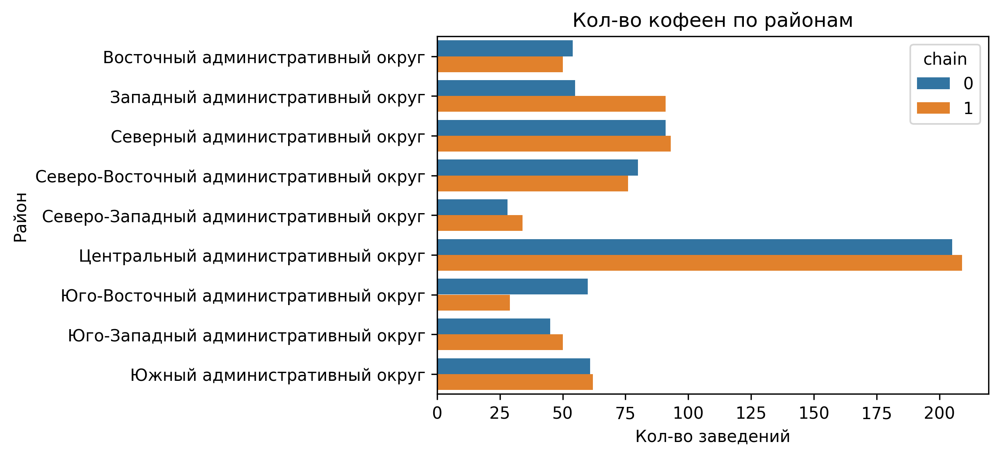

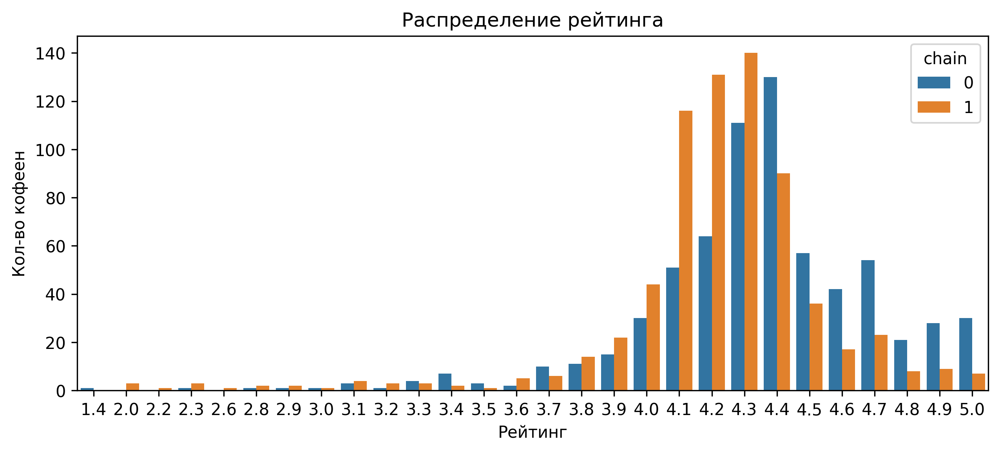

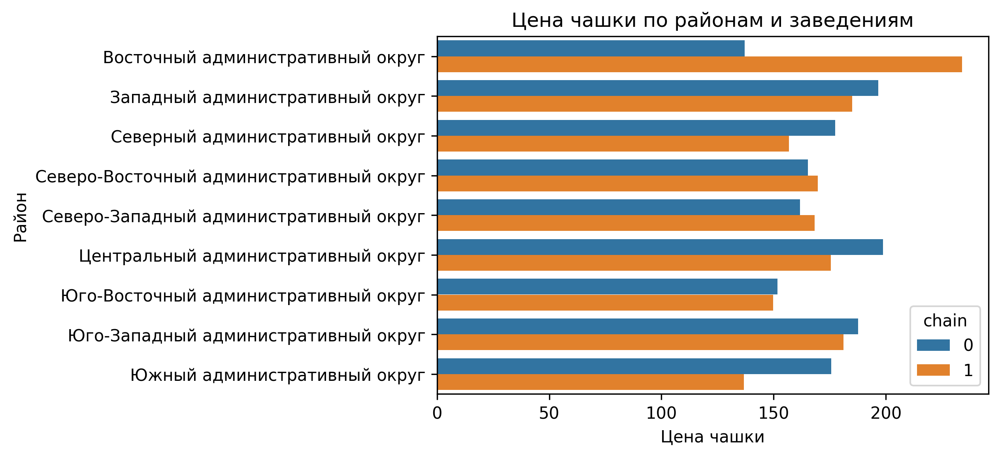

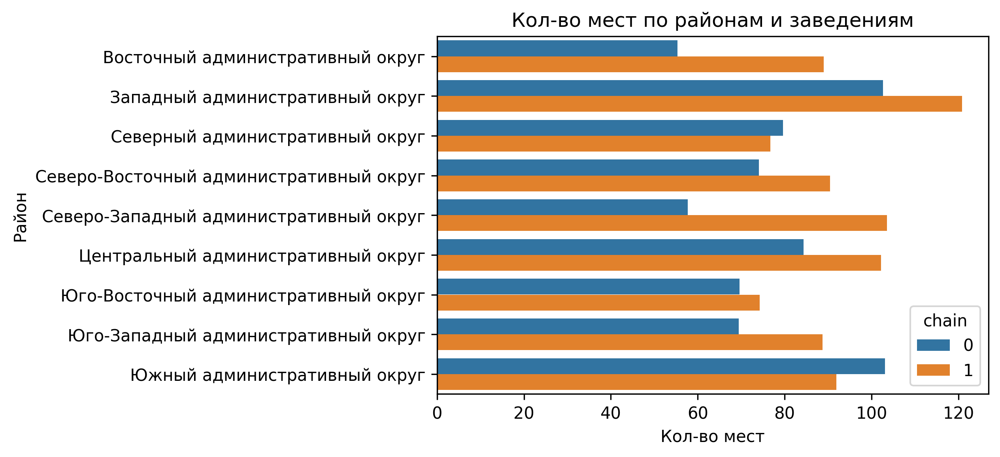

In [498]:
# доля сетей в кофейнях
print('Доля сетевых кофеен:', data_coffee['chain'].mean())

# Сети и индивидуалы по районам
data_coffee_chain = data_coffee.groupby(['chain', 'district'], as_index=False).agg({'name': 'count', 'middle_coffee_cup': 'mean', 'rating': 'mean', 'seats': 'mean'})
fig, ax = plt.subplots(dpi = 300)
ax = sns.barplot(data=data_coffee_chain, x='name', y='district', hue='chain')
ax.set_title('Кол-во кофеен по районам')
ax.set_xlabel('Кол-во заведений')
ax.set_ylabel('Район')

# Сети и индивидуалы по рейтингу
data_coffee_chain_ratings = data_coffee.groupby(['chain', 'rating'], as_index=False).agg({'name': 'count'}).sort_values('name', ascending=False)
fig, ax = plt.subplots(dpi=300)
ax = sns.barplot(data=data_coffee_chain_ratings, x='rating', y='name', hue='chain')
ax.set_title('Распределение рейтинга')
ax.set_xlabel('Рейтинг')
ax.set_ylabel('Кол-во кофеен')
fig.set_figwidth(10)

# Сети и индивидуалы по ценам
fig, ax = plt.subplots(dpi = 300)
ax = sns.barplot(data=data_coffee_chain, x='middle_coffee_cup', y='district', hue='chain')
ax.set_title('Цена чашки по районам и заведениям')
ax.set_xlabel('Цена чашки')
ax.set_ylabel('Район')

# Сети и индивидуалы по посадочным местам
fig, ax = plt.subplots(dpi = 300)
ax = sns.barplot(data=data_coffee_chain, x='seats', y='district', hue='chain')
ax.set_title('Кол-во мест по районам и заведениям')
ax.set_xlabel('Кол-во мест')
ax.set_ylabel('Район')

Сетевые кофейни составляют около половины от числа всех кофеен. Распределение по районам показывает, что в большинстве районов это соотношение сохраняется, кроме двух: в ЦАО незначительно больше сетевых кофеен, а в ЗАО значительно больше частных. Сравнение по рейтингу показывает, что кофейни с оценкой выше 4.3 гораздо чаще частные, чем сетевые и наоборот: оценки ниже чаще получают сетевые кофейни. Цена чашки между сетевыми и частными заведениями слабо зависит от района - где-то они равны, где-то меняются местами. Выделяется ВАО - цена чашки в сетевых кофейнях почти в два раза выше, чем в частных (возможно, в этом районе мало хороших частных кофеен) и ЦАО с ЮАО, где цена чашки в частных кофейнях значительно выше, чем в сетевых. Почти во всех районах кол-во мест в частных кофейнях меньше или примерно равно кол-ву мест в сетевых. Исключение: ЗАО.

## Выводы по кофейням

В исследуемом наборе данных представлены 1373 кофеен.

**Расположение**

Больше всего кофеен, как и других заведений, расположено в ЦАО. В основном кофейни располагаются на основных улицах, проспектах и перекрестках.

**Время работы**

В целом режим работы кофеен можно описать как работу в будни с 7:00 до 22:00 и в выходные с 9:00 до 22:00. Круглосуточных кофеен - всего 4%. Открытие кофейни с таким уникальным предложением может быть востребованно, но это нужно подкрепить отдельным исследованием.

**Рейтинг**

Средний рейтинг московских кофеен - 4,3. При открытии заведения стоит учитывать это значение. Рейтинг по районам распределен равномерно.

**Стоимость чашки**

Средняя стоимость чашки капучино составляет 175 рублей и довольно сильно зависит от района. Рейтинг не влияет на стоимость чашки. При выборе ценника следует опираться на расположение кофейни. Средний диапазон 120-250 рублей.

**Кол-во мест**

Кофейни в Москве - довольно большие заведения - в среднем 70 мест. От района кол-во мест зависит слабо. Есть гипотеза о том, что камерные места с малым количеством мест имеют рейтинг выше.

**Сети и индивидуалы**

Сетевые заведения занимают половину от всего числа кофеен и более-менее равномерно распределены по районам (кроме ЗАО). Однако, они не демпингуют: цены сравнимы. В ВАО даже наоборот: цена в сетевых в два раза выше, чем в частных. Кол-во мест сравнимо.  

**Рекомендации по открытию кофейни**

Чтобы ответить на вопрос "Реально ли открыть кофейню в Москве", данного исследования недостаточно: нужно считать экономику, исследовать интерьеры, инстаграмность, меню и реальные предпочтения посетителей. Данное исследование проводится по общим данным. Предположим, что открыть кофейню возможно. Тогда исходя из проведенного исследования я рекомендую:
- Расположение: не выбирать ЦАО и рассмотреть ВАО для открытия частной кофейни. Следует рассмотривать перекрестки магистральных улиц. Преображенский район.
- Время работы: будни с 7:00 до 22:00 и в выходные с 9:00 до 22:00.
- Рейтинг: следует рассчитывать минимум на 4.3 и стремиться к большему. 
- Стоимость чашки: 170-230 рублей
- Кол-во мест: 60-80, но нужно исследовать траффик.


**Рекомендации по проведению исследования**
- Исследовать расположение кофеен относительно метро, офисов и вузов
- Подключить к исследованию список перспективных улиц
- Исследовать меню, стили и качество интерьеров, музыку, скорость обслуживания.


# Презентация

Подготовлена презентация исследования для инвесторов о московском общепите и кофейнях. [Ссылка на PDF](https://drive.google.com/file/d/16OjbwHZyV-fL2yptfrJq2SsOZ2oPAx7B/view?usp=share_link) или  <https://drive.google.com/file/d/16OjbwHZyV-fL2yptfrJq2SsOZ2oPAx7B/view?usp=share_link> 

# Выводы по проекту

**В ходе выполнения проекта:**
* Обработаны исходные данные. Были обнаружены пропуски. Их количество значительно, но заполнить без искажения результатов невозможно. Созданы дополнительные статьи для анализа данных. Удалено незначительное количество дубликатов и строк с аномальными значениями.
* Проведен анализ предприятий общественного питания Москвы по категориям заведений, количеству мест в них, распределению по сетемым и несетевым, административным округам и т.д.
* По тем же критериям проведено детально рассмотрение предприятий типа "Кофейни" с целью формирования рекомендаций для инвестора.

**Сформулированы основные выводы по всем предприятиям общественного питания:**

* Самая популярная категория - кафе, к ней относятся 2316 заведений. Самая редкая категория - булочная, всего 252 заведений. Категории кафе и рестораны каждая составляет около четверти от всех заведений. Бары и пабы имеют в среднем самый высокий рейтинг около 4.4. Худший рейтинг у заведений быстрого питания и кафе, от 4.04.

* Медианное кол-во посадочных мест варьируется в пределах 60-80.

* В рассматриваемом наборе данных несетевые заведения превышают сетевые и соотносятся в количестве 5966 к 3084. Наиболее высокая доля сетевых заведений - 0.6 в категории булочных. Далее идут пиццерии и кофейни - доля сетевых заведений в этих категориях около 0.5. Самые популярные сети: Шоколадница, Домино'с Пицца, Додо Пицца и кофейни.

* Больше всего заведений расположено в ЦАО. Меньше всего - в СЗАО. Во всех районах кроме ЦАО кафе являются самыми распространенными заведениями. Самый высокий рейтинг и средний чек - также в заведениях ЦАО. Улицы, на которых работают больше всего заведений: пр. Мира, МКАД, Профсоюзная ул., Ленинский пр. Если говорить единственных заведениях на улице, то чаще, чем в общем, это будут кафе с значительно меньшим кол-вом посадочных мест.

**Рекомендации по открытию кофейни**
* Расположение: не выбирать ЦАО и рассмотреть ВАО для открытия частной кофейни. Следует рассмотривать перекрестки магистральных улиц. Преображенский район.
* Время работы: будни с 7:00 до 22:00 и в выходные с 9:00 до 22:00.
* Рейтинг: следует рассчитывать минимум на 4.3 и стремиться к большему. 
* Стоимость чашки: 170-230 рублей
* Кол-во мест: 60-80, но нужно исследовать траффик.

**Рекомендации по развитию исследования**
- Исследовать расположение кофеен относительно метро, офисов и вузов.
- Подключить к исследованию список перспективных улиц.
- Исследовать меню, стили и качество интерьеров, музыку, скорость обслуживания.
- Подключить экономическую часть.

## 